# Competing Methods

In this Jupyter Notebook, we aim to focus on benchmarking competing methods for denoising and/or clustering and/or batch correcting of scRNA-seq data. The main methods we aim to compare with are Scanorama, DCA, scVI, scdeepcluster, and MNN. DCA and scVI can be used both to cluster and denoise rna-seq data. scdeepcluster can be used only to cluster, and MNN can be used to correct for batch effect as a preprocessing step to clustering (and other downstream analyses). scVI is designed to batch correct data while clustering and denoising it as well.

Before running the notebook, please run the Rscripts "MNN_sampleMacaque.R" and "MNN_sampleMacaque_HVG.R"

## Setup

First, let's import requisite packages.

In [1]:
"""Broadly useful python packages"""
import pandas as pd
import os
import numpy as np
import pickle
import matplotlib.pyplot as plt
from time import time
from copy import deepcopy

"""Machine learning and single cell packages"""
import sklearn.metrics as metrics
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
import scanpy as sc
from anndata import AnnData, concat
from keras.optimizers import Adam
from keras.models import Model
import torch
import scanorama

"""import CarDEC normalize function"""
from normalize_cardec import normalize_scanpy

"""import scVI Package"""
import scvi
from scvi.model import SCVI

"""import scDeepCluster Code"""
from scDeepCluster_Method.preprocess import read_dataset, normalize
from scDeepCluster_Method.scDeepCluster_Algorithm import SCDeepCluster, cluster_acc

Using TensorFlow backend.


Next, let's define some helper functions.

In [2]:
"""Miscellaneous useful functions"""

def read_macaque(path,cache=True):
    """A function to read and preprocess the macaque data"""
    adata = sc.read(path)
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=30)

    adata.obs['n_counts'] = adata.X.sum(axis=1).A1
    adata = adata[adata.obs['n_genes'] < 2500, :]
    
    return(adata)

def read_macaque_full(path,cache=True):
    """A function to read and preprocess the macaque data"""
    adata = sc.read(path)
    
    return(adata)

def purity_score(y_true, y_pred):
    """A function to compute cluster purity"""
    # compute contingency matrix (also called confusion matrix)
    contingency_matrix = metrics.cluster.contingency_matrix(y_true, y_pred)

    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

def convert_string_to_encoding(string, vector_key):
    """A function to convert a string to a numeric encoding"""
    return np.argwhere(vector_key == string)[0][0]

def convert_vector_to_encoding(vector, printkey = False):
    """A function to convert a vector of strings to a dense numeric encoding"""
    vector_key = np.unique(vector)
    if printkey:
        print(pd.Series(vector_key))
    
    vector_strings = list(vector)
    vector_num = [convert_string_to_encoding(string, vector_key) for string in vector_strings]
    
    return vector_num

def build_dir(dir_path):
    subdirs = [dir_path]
    substring = dir_path

    while substring != '':
        splt_dir = os.path.split(substring)
        substring = splt_dir[0]
        subdirs.append(substring)
        
    subdirs.pop()
    subdirs = [x for x in subdirs if os.path.basename(x) != '..']

    n = len(subdirs)
    subdirs = [subdirs[n - 1 - x] for x in range(n)]
    
    for dir_ in subdirs:
        if not os.path.isdir(dir_):
            os.mkdir(dir_)
            
def find_resolution(adata_, n_clusters, random = 0): 
    obtained_clusters = -1
    iteration = 0
    resolutions = [0., 1000.]
    
    while obtained_clusters != n_clusters and iteration < 50:
        current_res = sum(resolutions)/2
        adata = sc.tl.louvain(adata_, resolution = current_res, random_state = random, copy = True)
        labels = adata.obs['louvain']
        
        obtained_clusters = len(np.unique(labels))
        
        if obtained_clusters < n_clusters:
            resolutions[0] = current_res
        else:
            resolutions[1] = current_res
        
        iteration = iteration + 1
        
    return current_res

Lastly, let's grab the set of highly variable genes that were defined for CarDEC.

In [3]:
"""Read and normalize the data"""
adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)

adata2 = normalize_scanpy(adata, batch_key = "sample", n_high_var = 2000, LVG = True)

HVGs = adata2.var.index[adata2.var["Variance Type"] == "HVG"].values

Trying to set attribute `.var` of view, copying.
/Users/jlakkis/anaconda3/envs/cardec_alternatives/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:848: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


## Figure Data

In [4]:
ARI_data = {'ARI': [0] * 4,
            'NMI': [0] * 4,
            'Purity': [0] * 4,
           'Method': ['Scanorama', 'DCA', 'scVI', 'scDeepCluster']}
ARI_data = pd.DataFrame(ARI_data)

ARI_data_gene = {'ARI': [0] * 8,
            'NMI': [0] * 8,
            'Purity': [0] * 8,
           'Method': ['Scanorama'] * 2 + ['DCA'] * 2 + ['scVI'] * 2 + ['MNN'] * 2,
                'Type': ['HVG', 'LVG'] * 4}
ARI_data_gene = pd.DataFrame(ARI_data_gene)

ARI_HVGo_gene = {'ARI': [0] * 4,
            'NMI': [0] * 4,
            'Purity': [0] * 4,
           'Method': ['Scanorama', 'DCA', 'scVI', 'MNN']}
ARI_HVGo_gene = pd.DataFrame(ARI_HVGo_gene)

figure_path = "../Figures/macaque"
figure_path_supplement = "../Figures/macaque_supplement"
figure_path_embedding = "../Figures/macaque_embedding"

build_dir(figure_path)
build_dir(figure_path_supplement)
build_dir(figure_path_embedding)

## Scanorama

The first method to which we compare is Scanorama. Scanorama is a batch correction method that uses a nearest neighbors approach. For more information, please consult the references.

Manuscript: https://www.nature.com/articles/s41587-019-0113-3

Software: https://github.com/brianhie/scanorama

### HVGs Only

In [5]:
adata2 = adata.copy()
sc.pp.normalize_per_cell(adata2)
sc.pp.log1p(adata2)

Perform batch correction

In [6]:
# split per batch into new objects.
batches = adata2.obs['sample'].cat.categories.tolist()
alldata = {}
recover_id_list = []
for batch in batches:
    alldata[batch] = adata2[adata2.obs['sample'] == batch, HVGs].copy()
    recover_id_list.append(np.where(adata.obs["sample"] == batch)[0])
recover_id = np.concatenate(recover_id_list)

#convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
corrected = scanorama.correct_scanpy(adatas, dimred = 50, return_dimred = True, verbose = False) #correct_scanpy,integrate_scanpy

Found 2000 genes among all datasets


In [7]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in corrected]
# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

(30298, 50)


In [8]:
formatting = AnnData(all_s)
formatting.obs = adata[recover_id].obs.copy()

Get the predicted labels and compute adjusted rand score for the Scanorama embedding

Scanorama Clustering Results
ARI = 0.1826
NMI = 0.3914
Purity = 0.4946


... storing 'predicted' as categorical


Done


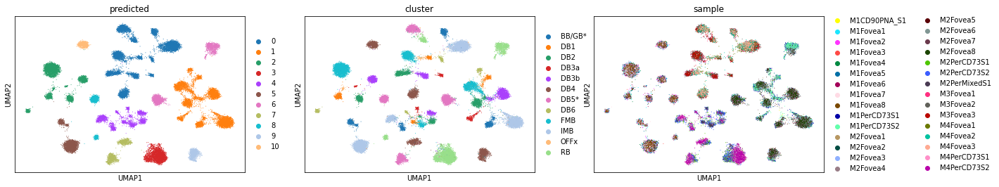

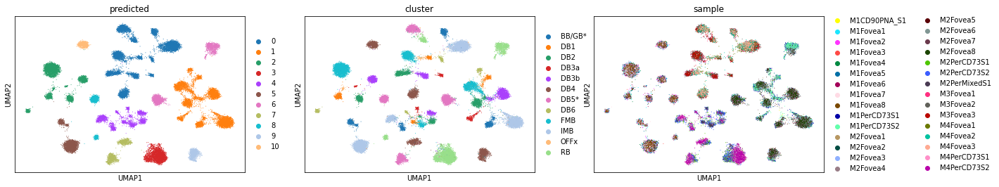

In [9]:
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(formatting.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("Scanorama Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["predicted"] = list(labels)
sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cluster", "sample"], return_fig=True)
print("Done")

visual

In [10]:
adata_tmp = concat(corrected)

Get the predicted labels and compute adjusted rand score for the feature space (HVGs only)

... storing 'sample' as categorical
... storing 'macaque_id' as categorical
... storing 'cluster' as categorical
... storing 'region' as categorical


Scanorama Denoising Results for HVG
ARI = 0.1805
NMI = 0.3884
Purity = 0.4889


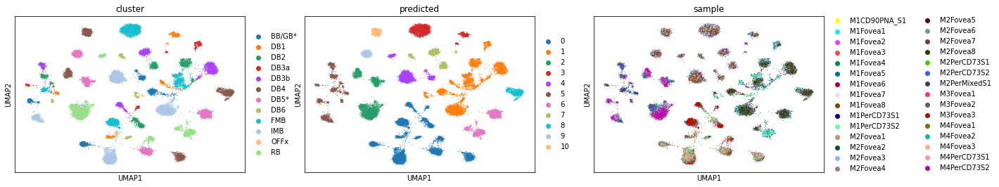

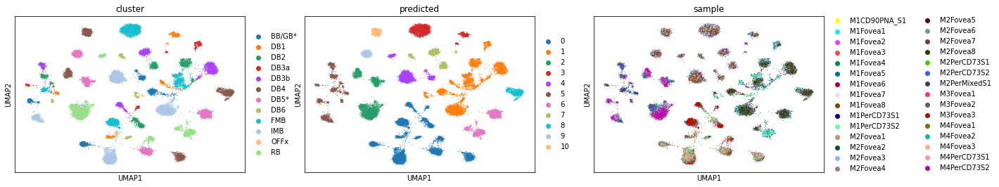

In [11]:
HVG_denoised = adata_tmp

sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)
res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("Scanorama Denoising Results for HVG")

visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample"], return_fig = True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for paper"""
ARI_HVGo_gene.iloc[0,:3] = ARI, NMI, Purity
DF = pd.DataFrame(HVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = HVG_denoised.obs['macaque_id'].values
DF['Sample'] = HVG_denoised.obs['sample'].values
DF['Region'] = HVG_denoised.obs['region'].values
DF['Cell Type'] = HVG_denoised.obs['cluster'].values
DF.index = HVG_denoised.obs.index

base_path = 'Scanorama_HVGOnly.csv'
path = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)

visual

### All Genes

In [12]:
adata2 = adata.copy()
sc.pp.normalize_per_cell(adata2)
sc.pp.log1p(adata2)

Perform batch correction

In [13]:
# split per batch into new objects.
batches = adata2.obs['sample'].cat.categories.tolist()
alldata = {}
recover_id_list = []
for batch in batches:
    alldata[batch] = adata2[adata2.obs['sample'] == batch].copy()
    recover_id_list.append(np.where(adata.obs["sample"] == batch)[0])
recover_id = np.concatenate(recover_id_list)

#convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
corrected = scanorama.correct_scanpy(adatas, dimred = 50, return_dimred = True, verbose = False) #correct_scanpy,integrate_scanpy

Found 18083 genes among all datasets


In [14]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm['X_scanorama'] for ad in corrected]
# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

(30298, 50)


In [15]:
formatting = AnnData(all_s)
formatting.obs = adata[recover_id].obs.copy()

Get the predicted labels and compute adjusted rand score for the Scanorama embedding

Scanorama Clustering Results
ARI = 0.5740
NMI = 0.7115
Purity = 0.7645


... storing 'predicted' as categorical


Done


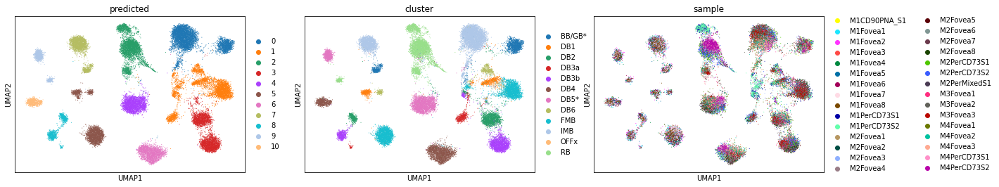

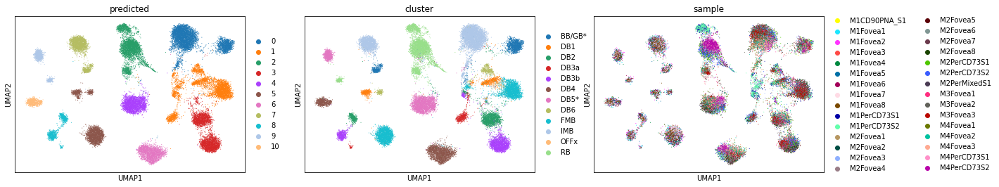

In [16]:
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(formatting.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("Scanorama Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["predicted"] = list(labels)
sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cluster", "sample"], return_fig=True)
print("Done")

"""Figure info for paper"""
DF = pd.DataFrame(formatting.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = HVG_denoised.obs['macaque_id'].values
DF['Sample'] = HVG_denoised.obs['sample'].values
DF['Region'] = HVG_denoised.obs['region'].values
DF['Cell Type'] = HVG_denoised.obs['cluster'].values
DF.index = formatting.obs.index

base_path = 'Scanorama.csv'
path = os.path.join(figure_path_embedding, base_path)

DF.to_csv(path)

"""Figure info for paper"""

ARI_data.iloc[0,:3] = ARI, NMI, Purity

visual

In [17]:
adata_tmp = concat(corrected)

Get the predicted labels and compute adjusted rand score for the feature space (HVGs only)

... storing 'sample' as categorical
... storing 'macaque_id' as categorical
... storing 'cluster' as categorical
... storing 'region' as categorical


Scanorama Denoising Results for HVG
ARI = 0.4602
NMI = 0.6574
Purity = 0.6857


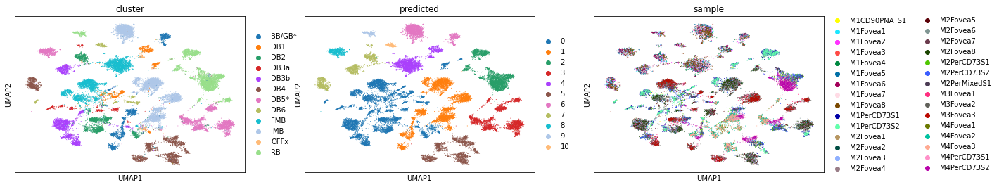

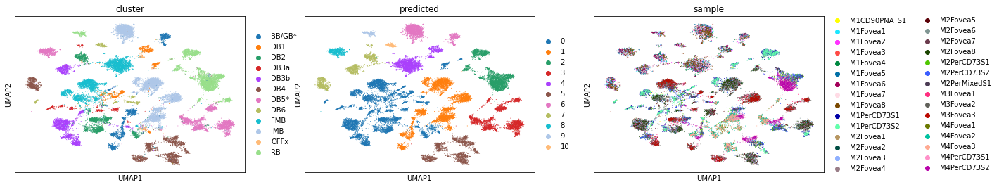

In [18]:
HVG_denoised = adata_tmp.copy()
indices = [x in HVGs for x in list(HVG_denoised.var.index)]
HVG_denoised = HVG_denoised[:, indices]

sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)
res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("Scanorama Denoising Results for HVG")

visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample"], return_fig = True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for paper"""
ARI_data_gene.iloc[0,:3] = ARI, NMI, Purity
DF = pd.DataFrame(HVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = HVG_denoised.obs['macaque_id'].values
DF['Sample'] = HVG_denoised.obs['sample'].values
DF['Region'] = HVG_denoised.obs['region'].values
DF['Cell Type'] = HVG_denoised.obs['cluster'].values
DF.index = HVG_denoised.obs.index

base_path = 'Scanorama_HVG.csv'
path = os.path.join(figure_path, base_path)

DF.to_csv(path)

visual

Get the predicted labels and compute adjusted rand score for the feature space (LVGs only)

... storing 'sample' as categorical
... storing 'macaque_id' as categorical
... storing 'cluster' as categorical
... storing 'region' as categorical


Scanorama Denoising Results for LVG
ARI = 0.2053
NMI = 0.4040
Purity = 0.4817


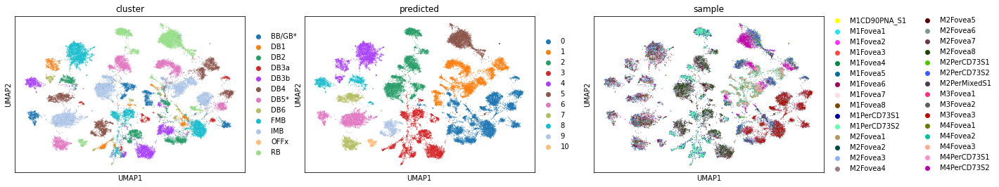

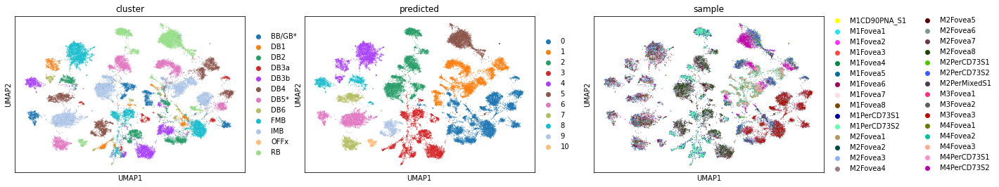

In [19]:
LVG_denoised = adata_tmp.copy()
indices = [x not in HVGs for x in list(LVG_denoised.var.index)]
LVG_denoised = LVG_denoised[:, indices]

sc.tl.pca(LVG_denoised, svd_solver='arpack')
sc.pp.neighbors(LVG_denoised, n_neighbors = 15)
sc.tl.umap(LVG_denoised)
res = find_resolution(LVG_denoised, 11)
LVG_denoised = sc.tl.louvain(LVG_denoised, resolution = res, copy = True)

labels = LVG_denoised.obs['louvain']
LVG_denoised.obs['predicted'] = LVG_denoised.obs['louvain']
type_strings = list(LVG_denoised.obs['cluster'])

print("Scanorama Denoising Results for LVG")

visual = sc.pl.umap(LVG_denoised, color = ["cluster", "predicted", "sample"], return_fig = True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for paper"""
ARI_data_gene.iloc[1,:3] = ARI, NMI, Purity
DF = pd.DataFrame(LVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = LVG_denoised.obs['macaque_id'].values
DF['Sample'] = LVG_denoised.obs['sample'].values
DF['Region'] = LVG_denoised.obs['region'].values
DF['Cell Type'] = LVG_denoised.obs['cluster'].values
DF.index = LVG_denoised.obs.index

base_path = 'Scanorama_LVG.csv'
path = os.path.join(figure_path, base_path)

DF.to_csv(path)

visual

## DCA (Deep Count Autoencoder)

The second method to which we compare is DCA, Deep Count Autoencoder. DCA is a model for denoising scRNA-seq data. In short, DCA is an autoencoder that maximizes either a negative-binomial likelihood or a zero-inflated negative-binomial likelihood. The estimated negative binomial means are regarded as denoised counts and can be used for downstream analysis. For more information, please consult the references.

Manuscript: https://www.nature.com/articles/s41467-018-07931-2

Software: https://github.com/theislab/dca

### DCA with Conditional Negative Binomial Loss

In the first evaluation, we fit a DCA model with a negative binomial likelihood with conditional dispersion. We check the capacity of the model to denoise the data and to cluster it. We evaluate denoised counts for highly variable and lowly variable genes separtely.

We start by creating directories if necessary, and loading the DCA denoised counts and latent space. If these matrices do not already exist, we fit the DCA model and save the outputted matrices.

#### HVGs Only

In [20]:
build_dir("DCA Results/NB")
build_dir("DCA Results/ZINB")

if (not os.path.exists("DCA Results/NB/DCA_latent_HVG.h5ad")) or (not os.path.exists("DCA Results/NB/DCA_denoise_HVG.h5ad")):
    adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
    adata_ae = adata[:,HVGs].copy()

    adata_ae2 = adata_ae.copy()
        
    adata_ae.X = adata_ae.X.toarray()
    
    print("Run DCA in Denoise Mode")
    start = time()
    sc.external.pp.dca(adata_ae, mode = 'denoise', ae_type='nb-conddisp', verbose = True)
    print(time() - start)

    adata_ae.write(filename = "DCA Results/NB/DCA_denoise_HVG.h5ad")
    
    print("Run DCA in Latent Mode")
    start = time()
    sc.external.pp.dca(adata_ae2, mode = 'latent', ae_type='nb-conddisp', verbose = True)
    print(time() - start)

    adata_ae2.write(filename="DCA Results/NB/DCA_latent_HVG.h5ad")

dca_denoised = read_macaque_full("DCA Results/NB/DCA_denoise_HVG.h5ad")

dca_latent = read_macaque_full("DCA Results/NB/DCA_latent_HVG.h5ad")

In [21]:
sc.pp.normalize_total(dca_denoised)
sc.pp.log1p(dca_denoised)
sc.pp.combat(dca_denoised, key = 'sample')
sc.pp.scale(dca_denoised)
tmp = AnnData(dca_latent.obsm['X_dca'])
tmp.obs = dca_latent.obs
dca_latent.obsm['X_dca'] = sc.pp.combat(tmp, key = 'sample', inplace = False)

Now, we cluster cells using the denoised counts of the top 2000 highly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

Negative Binomial DCA Denoising Results for HVG
ARI = 0.8505
NMI = 0.8669
Purity = 0.8981


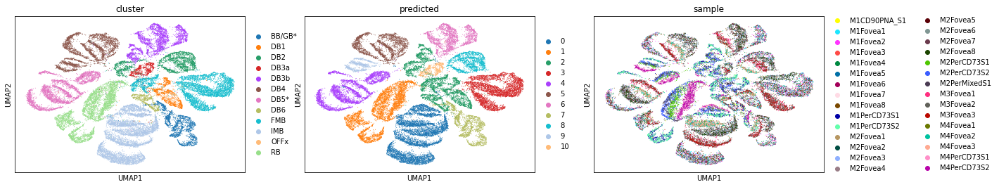

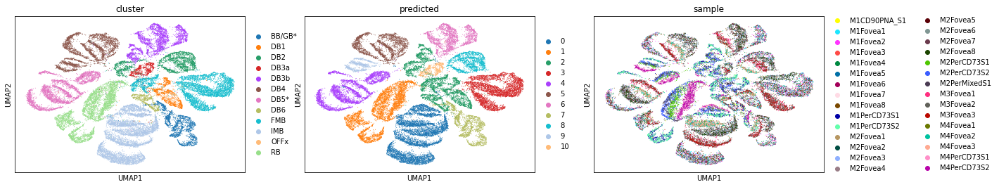

In [22]:
HVG_denoised = dca_denoised.copy()

sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)
res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("Negative Binomial DCA Denoising Results for HVG")

visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for paper"""
ARI_HVGo_gene.iloc[1,:3] = ARI, NMI, Purity
DF = pd.DataFrame(HVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = HVG_denoised.obs['macaque_id'].values
DF['Sample'] = HVG_denoised.obs['sample'].values
DF['Region'] = HVG_denoised.obs['region'].values
DF['Cell Type'] = HVG_denoised.obs['cluster'].values
DF.index = HVG_denoised.obs.index

base_path = 'DCA_HVGOnly.csv'
path = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)

visual

Lastly, we cluster cells using the low-dimensional latent space learned by DCA using scanpy. We visualize the latent space using UMAP, and compute the various clustering accuracy metrics.

Negative Binomial DCA Clustering Results
ARI = 0.9441
NMI = 0.9387
Purity = 0.9626


... storing 'cluster' as categorical
... storing 'predicted' as categorical
... storing 'sample' as categorical


Done


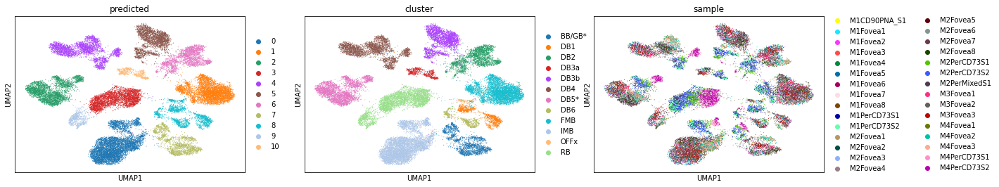

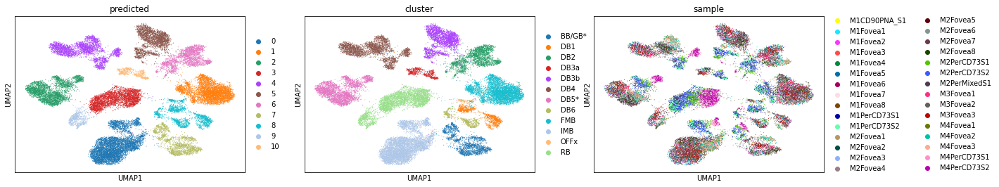

In [23]:
"""Get the predicted labels and compute adjusted rand score for the DCA embedding"""

emb = deepcopy(dca_latent.obsm['X_dca'])

formatting = AnnData(emb)
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(dca_latent.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("Negative Binomial DCA Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["cluster"] = list(dca_latent.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["sample"] = list(dca_latent.obs['sample'])
sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cluster", "sample"], return_fig=True)
print("Done")

visual

#### All Genes

In [24]:
if (not os.path.exists("DCA Results/NB/DCA_latent.h5ad")) or (not os.path.exists("DCA Results/NB/DCA_denoise.h5ad")):
    
    adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
    adata_ae = adata.copy()

    adata_ae2 = adata_ae.copy()
        
    adata_ae.X = adata_ae.X.toarray()
    
    print("Run DCA in Denoise Mode")
    start = time()
    sc.external.pp.dca(adata_ae, mode = 'denoise', ae_type='nb-conddisp', verbose = True)
    print(time() - start)

    adata_ae.write(filename = "DCA Results/NB/DCA_denoise.h5ad")
    
    print("Run DCA in Latent Mode")
    start = time()
    sc.external.pp.dca(adata_ae2, mode = 'latent', ae_type='nb-conddisp', verbose = True)
    print(time() - start)

    adata_ae2.write(filename="DCA Results/NB/DCA_latent.h5ad")

dca_denoised = read_macaque_full("DCA Results/NB/DCA_denoise.h5ad")

dca_latent = read_macaque_full("DCA Results/NB/DCA_latent.h5ad")

In [25]:
sc.pp.normalize_total(dca_denoised)
sc.pp.log1p(dca_denoised)
sc.pp.combat(dca_denoised, key = 'sample')
sc.pp.scale(dca_denoised)
tmp = AnnData(dca_latent.obsm['X_dca'])
tmp.obs = dca_latent.obs
dca_latent.obsm['X_dca'] = sc.pp.combat(tmp, key = 'sample', inplace = False)

Now, we cluster cells using the denoised counts of the top 2000 highly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

Negative Binomial DCA Denoising Results for HVG
ARI = 0.4906
NMI = 0.7173
Purity = 0.7354


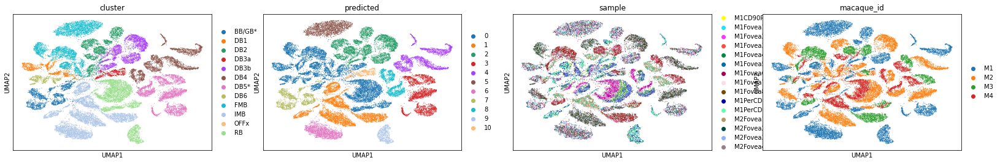

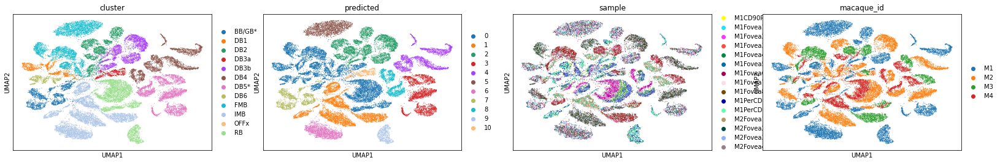

In [26]:
HVG_denoised = dca_denoised.copy()
indices = [x in HVGs for x in list(HVG_denoised.var.index)]
HVG_denoised = HVG_denoised[:, indices]

sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)

res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("Negative Binomial DCA Denoising Results for HVG")

visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_data_gene.iloc[2,:3] = ARI, NMI, Purity
DF = pd.DataFrame(HVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = HVG_denoised.obs['macaque_id'].values
DF['Sample'] = HVG_denoised.obs['sample'].values
DF['Region'] = HVG_denoised.obs['region'].values
DF['Cell Type'] = HVG_denoised.obs['cluster'].values
DF.index = HVG_denoised.obs.index

base_path = 'DCA_HVG.csv'
path = os.path.join(figure_path, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

Then, we cluster cells using the denoised counts of the lowly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

Negative Binomial DCA Denoising Results for LVG
ARI = 0.4405
NMI = 0.6387
Purity = 0.6627


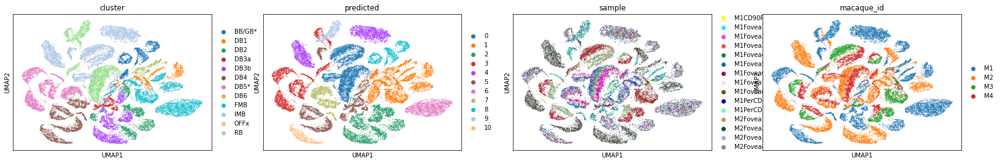

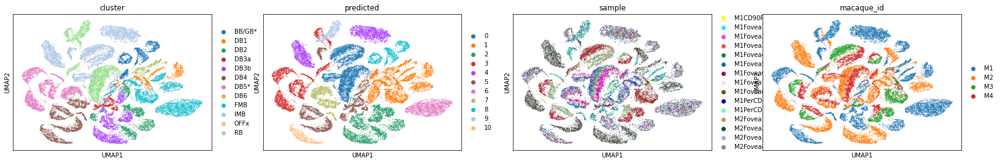

In [27]:
LVG_denoised = dca_denoised.copy()
indices = [x not in HVGs for x in list(LVG_denoised.var.index)]
LVG_denoised = LVG_denoised[:, indices]

sc.tl.pca(LVG_denoised, svd_solver='arpack')
sc.pp.neighbors(LVG_denoised, n_neighbors = 15)
sc.tl.umap(LVG_denoised)
res = find_resolution(LVG_denoised, 11)
LVG_denoised = sc.tl.louvain(LVG_denoised, resolution = res, copy = True)

labels = LVG_denoised.obs['louvain']
LVG_denoised.obs['predicted'] = LVG_denoised.obs['louvain']
type_strings = list(LVG_denoised.obs['cluster'])

print("Negative Binomial DCA Denoising Results for LVG")

visual = sc.pl.umap(LVG_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_data_gene.iloc[3,:3] = ARI, NMI, Purity
DF = pd.DataFrame(LVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = LVG_denoised.obs['macaque_id'].values
DF['Sample'] = LVG_denoised.obs['sample'].values
DF['Region'] = LVG_denoised.obs['region'].values
DF['Cell Type'] = LVG_denoised.obs['cluster'].values
DF.index = LVG_denoised.obs.index

base_path = 'DCA_LVG.csv'
path = os.path.join(figure_path, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

Lastly, we cluster cells using the low-dimensional latent space learned by DCA using scanpy. We visualize the latent space using UMAP, and compute the various clustering accuracy metrics.

Negative Binomial DCA Clustering Results
ARI = 0.8106
NMI = 0.8760
Purity = 0.8855


... storing 'cell_type' as categorical
... storing 'predicted' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'macaque_id' as categorical


Done


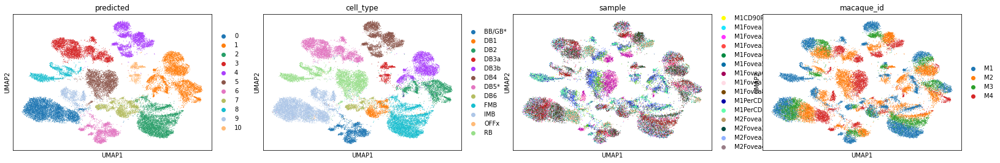

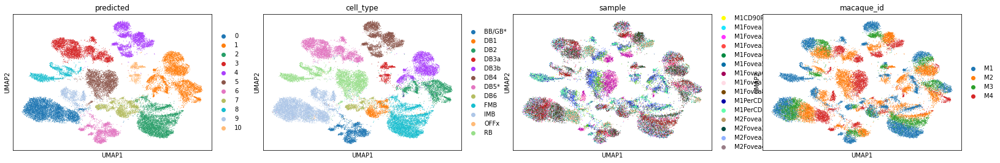

In [28]:
"""Get the predicted labels and compute adjusted rand score for the DCA embedding"""

emb = deepcopy(dca_latent.obsm['X_dca'])

formatting = AnnData(emb)
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(dca_latent.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("Negative Binomial DCA Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["cell_type"] = list(dca_latent.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["sample"] = list(dca_latent.obs['sample'])
formatting.obs["region"] = list(dca_latent.obs['region'])
formatting.obs["macaque_id"] = list(dca_latent.obs['macaque_id'])
sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cell_type", "sample", "macaque_id"], return_fig=True)
print("Done")

"""Figure info for paper"""
DF = pd.DataFrame(formatting.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Region'] = formatting.obs['region'].values
DF['Macaque'] = formatting.obs['macaque_id'].values
DF['Sample'] = formatting.obs['sample'].values
DF['Cell Type'] = formatting.obs['cell_type'].values
DF.index = formatting.obs.index

base_path = 'DCA.csv'
path = os.path.join(figure_path_embedding, base_path)

DF.to_csv(path)

ARI_data.iloc[1,:3] = ARI, NMI, Purity

visual

### DCA with Zero-Inflated Conditional Negative Binomial Loss

In the second evaluation, we fit a DCA model with a zero inflated negative binomial likelihood with conditional dispersion. We check the capacity of the model to denoise the data and to cluster it. We evaluate denoised counts for highly variable and lowly variable genes separtely.

We start by loading the DCA denoised counts and latent space. If these matrices do not already exist, we fit the DCA model and save them.

#### HVGs Only

In [29]:
if (not os.path.exists("DCA Results/ZINB/DCA_latent_HVG.h5ad")) or (not os.path.exists("DCA Results/ZINB/DCA_denoise_HVG.h5ad")):
    
    adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
    adata_ae = adata[:,HVGs].copy()

    adata_ae2 = adata_ae.copy()
        
    adata_ae.X = adata_ae.X.toarray()
    
    print("Run DCA in Denoise Mode")
    start = time()
    sc.external.pp.dca(adata_ae, mode = 'denoise', ae_type='zinb-conddisp', verbose = True)
    print(time() - start)

    adata_ae.write(filename = "DCA Results/ZINB/DCA_denoise_HVG.h5ad")
    
    print("Run DCA in Latent Mode")
    start = time()
    sc.external.pp.dca(adata_ae2, mode = 'latent', ae_type='zinb-conddisp', verbose = True)
    print(time() - start)

    adata_ae2.write(filename="DCA Results/ZINB/DCA_latent_HVG.h5ad")

dca_denoised = read_macaque_full("DCA Results/ZINB/DCA_denoise_HVG.h5ad")

dca_latent = read_macaque_full("DCA Results/ZINB/DCA_latent_HVG.h5ad")

In [30]:
sc.pp.normalize_total(dca_denoised)
sc.pp.log1p(dca_denoised)
sc.pp.combat(dca_denoised, key = 'sample')
sc.pp.scale(dca_denoised)
tmp = AnnData(dca_latent.obsm['X_dca'])
tmp.obs = dca_latent.obs
dca_latent.obsm['X_dca'] = sc.pp.combat(tmp, key = 'sample', inplace = False)

Now, we cluster cells using the denoised counts of the top 2000 highly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

DCA Denoising Results for HVG
ARI = 0.7258
NMI = 0.8397
Purity = 0.8935


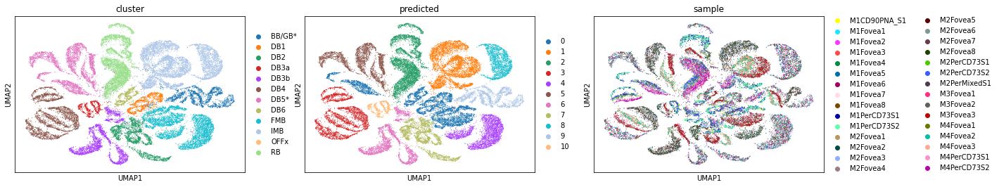

In [31]:
HVG_denoised = dca_denoised.copy()

sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)
res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("DCA Denoising Results for HVG")

visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

Lastly, we cluster cells using the low-dimensional latent space learned by DCA using scanpy. We visualize the latent space using UMAP, and compute the various clustering accuracy metrics.

Negative Binomial DCA Clustering Results
ARI = 0.8106
NMI = 0.8760
Purity = 0.8855


... storing 'cell_type' as categorical
... storing 'predicted' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'macaque_id' as categorical


Done


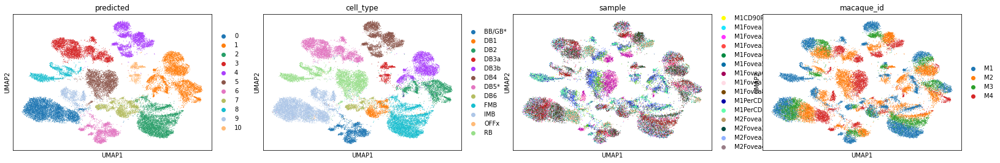

In [32]:
"""Get the predicted labels and compute adjusted rand score for the DCA embedding"""

emb = deepcopy(dca_latent.obsm['X_dca'])

fformatting = AnnData(emb)
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(dca_latent.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("Negative Binomial DCA Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["cell_type"] = list(dca_latent.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["sample"] = list(dca_latent.obs['sample'])
formatting.obs["region"] = list(dca_latent.obs['region'])
formatting.obs["macaque_id"] = list(dca_latent.obs['macaque_id'])
sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cell_type", "sample", "macaque_id"], return_fig=True)
print("Done")

#### All Genes

In [33]:
if (not os.path.exists("DCA Results/ZINB/DCA_latent.h5ad")) or (not os.path.exists("DCA Results/ZINB/DCA_denoise.h5ad")):
    
    adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
    adata_ae = adata.copy()

    adata_ae2 = adata_ae.copy()
        
    adata_ae.X = adata_ae.X.toarray()
    
    print("Run DCA in Denoise Mode")
    start = time()
    sc.external.pp.dca(adata_ae, mode = 'denoise', ae_type='zinb-conddisp', verbose = True)
    print(time() - start)

    adata_ae.write(filename="DCA Results/ZINB/DCA_denoise.h5ad")
    
    print("Run DCA in Latent Mode")
    start = time()
    sc.external.pp.dca(adata_ae2, mode = 'latent', ae_type='zinb-conddisp', verbose = True)
    print(time() - start)

    adata_ae2.write(filename="DCA Results/ZINB/DCA_latent.h5ad")
    
dca_denoised = read_macaque_full("DCA Results/ZINB/DCA_denoise.h5ad")

dca_latent = read_macaque_full("DCA Results/ZINB/DCA_latent.h5ad")

In [34]:
sc.pp.normalize_total(dca_denoised)
sc.pp.log1p(dca_denoised)
sc.pp.combat(dca_denoised, key = 'sample')
sc.pp.scale(dca_denoised)

tmp = AnnData(dca_latent.obsm['X_dca'])
tmp.obs = dca_latent.obs
dca_latent.obsm['X_dca'] = sc.pp.combat(tmp, key = 'sample', inplace = False)

Now, we cluster cells using the denoised counts of the top 2000 highly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

DCA Denoising Results for HVG
ARI = 0.4465
NMI = 0.6272
Purity = 0.6461


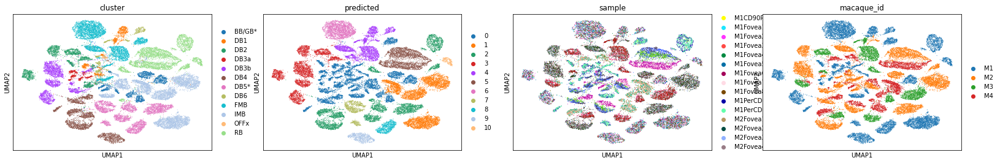

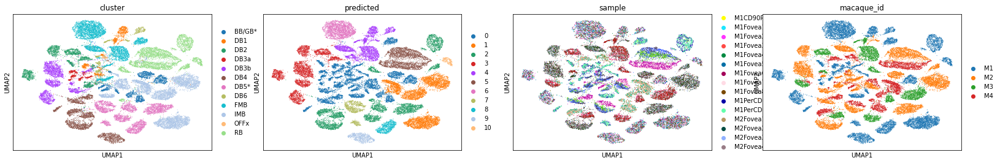

In [35]:
HVG_denoised = dca_denoised.copy()
indices = [x in HVGs for x in list(HVG_denoised.var.index)]
HVG_denoised = HVG_denoised[:, indices]
    
sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)
res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("DCA Denoising Results for HVG")

visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

visual

Then, we cluster cells using the denoised counts of the lowly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

DCA Denoising Results for LVG
ARI = 0.4611
NMI = 0.5982
Purity = 0.6575


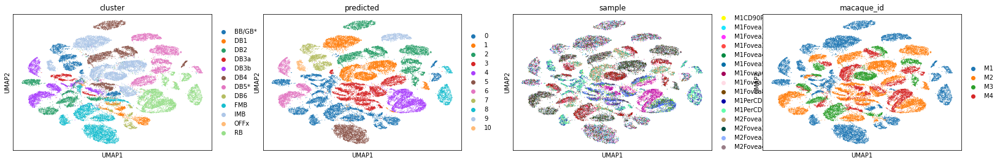

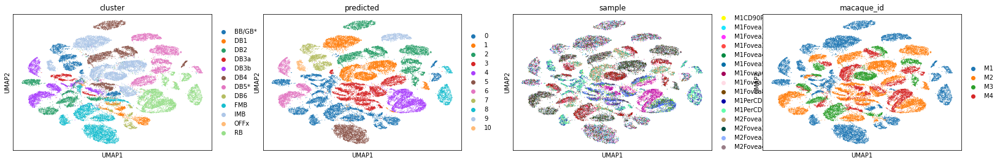

In [36]:
LVG_denoised = dca_denoised.copy()
indices = [x not in HVGs for x in list(LVG_denoised.var.index)]
LVG_denoised = LVG_denoised[:, indices]
    
sc.tl.pca(LVG_denoised, svd_solver='arpack')
sc.pp.neighbors(LVG_denoised, n_neighbors = 15)
sc.tl.umap(LVG_denoised)
res = find_resolution(LVG_denoised, 11)
LVG_denoised = sc.tl.louvain(LVG_denoised, resolution = res, copy = True)

labels = LVG_denoised.obs['louvain']
LVG_denoised.obs['predicted'] = LVG_denoised.obs['louvain']
type_strings = list(LVG_denoised.obs['cluster'])

print("DCA Denoising Results for LVG")

visual = sc.pl.umap(LVG_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

visual

Lastly, we cluster cells using the low-dimensional latent space learned by DCA using scanpy. We visualize the latent space using UMAP, and compute the various clustering accuracy metrics.

ZINB DCA Clustering Results
ARI = 0.8297
NMI = 0.8818
Purity = 0.8867


... storing 'cell_type' as categorical
... storing 'predicted' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'macaque_id' as categorical


Done


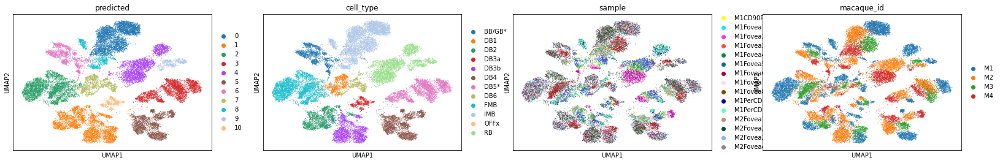

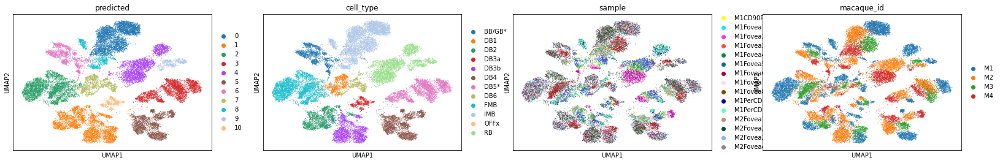

In [37]:
"""Get the predicted labels and compute adjusted rand score for the DCA embedding"""

emb = deepcopy(dca_latent.obsm['X_dca'])

formatting = AnnData(emb)
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(dca_latent.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("ZINB DCA Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["cell_type"] = list(dca_latent.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["sample"] = list(dca_latent.obs['sample'])
formatting.obs["region"] = list(dca_latent.obs['region'])
formatting.obs["macaque_id"] = list(dca_latent.obs['macaque_id'])
sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cell_type", "sample", "macaque_id"], return_fig=True)
print("Done")

visual

## scVI

In the third evaluation, we evalue scVI, single-cell Variational Inference. scVI is a variational inference model for denoising and downstream analysis of scRNA-seq data. Like DCA, it maximizes a zero inflated negative binomial likelihood. Unlike DCA, which uses a standard autoencoder, scVI fits a variational autoencoder. scVI is also designed to adjust for batch effects through the inclusion of indicators in the latent space. For more information, please consult the references.

Manuscript: https://www.nature.com/articles/s41592-018-0229-2

Software: https://github.com/YosefLab/scVI

First, let's create directories to save our models.

In [38]:
build_dir("scVI Results HVG/macaque")
build_dir("scVI Results HVGScanpy/macaque")
build_dir("scVI Results All/macaque")

#### HVGs Only

In [39]:
anndataset = read_macaque("../Data/macaque_bc.h5ad")
batch_vec = anndataset.obs['sample']
sub_data = anndataset[:,HVGs].copy()
scvi.data.setup_anndata(sub_data, batch_key="sample")

vae = SCVI(sub_data, n_layers = 2)

filename = 'scVI Results HVG/macaque/bestmodelnew'

if not os.path.exists(filename):
    for i in range(200):
        vae.train(n_epochs = 200)
        vae.save(dir_path = filename)

vae = vae.load(adata = sub_data, dir_path = filename)

latent = vae.get_latent_representation()
normalized_values = vae.get_normalized_expression(
    library_size=1e4, 
    transform_batch = "M1Fovea1", 
    n_samples=10, 
    return_mean=True,
)

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 30298 cells, 2000 genes, 30       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


Now, we cluster cells using the denoised counts of the top 2000 highly variable genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

... storing 'sample' as categorical


scVI Denoising Results for HVG
ARI = 0.9742
NMI = 0.9600
Purity = 0.9834


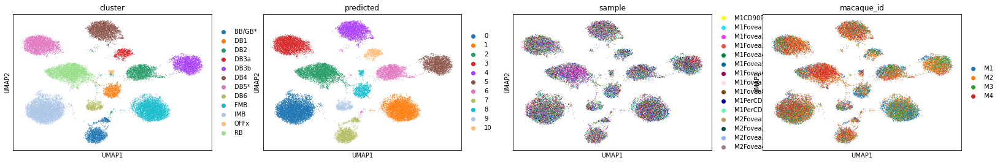

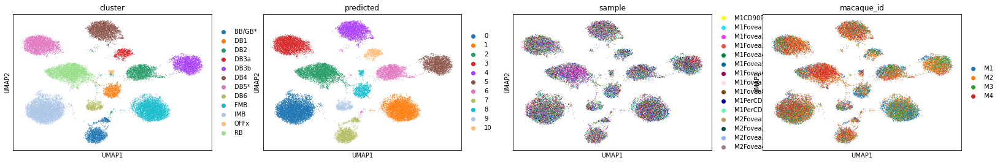

In [40]:
HVG_denoised = AnnData(deepcopy(normalized_values))
HVG_denoised.obs = anndataset.obs

sc.pp.log1p(HVG_denoised)
sc.pp.scale(HVG_denoised)
    
sc.tl.pca(HVG_denoised, svd_solver='arpack')
sc.pp.neighbors(HVG_denoised, n_neighbors = 15)
sc.tl.umap(HVG_denoised)
res = find_resolution(HVG_denoised, 11)
HVG_denoised = sc.tl.louvain(HVG_denoised, resolution = res, copy = True)

labels = HVG_denoised.obs['louvain']
HVG_denoised.obs['predicted'] = HVG_denoised.obs['louvain']
type_strings = list(HVG_denoised.obs['cluster'])

print("scVI Denoising Results for HVG")

HVG_denoised.obs['sample'] = list(batch_vec)
visual = sc.pl.umap(HVG_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_HVGo_gene.iloc[2,:3] = ARI, NMI, Purity
DF = pd.DataFrame(HVG_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = HVG_denoised.obs['macaque_id'].values
DF['Sample'] = HVG_denoised.obs['sample'].values
DF['Region'] = HVG_denoised.obs['region'].values
DF['Cell Type'] = HVG_denoised.obs['cluster'].values
DF.index = HVG_denoised.obs.index

base_path = 'scVI_HVGOnly.csv'
path = os.path.join(figure_path_supplement, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

Then, we cluster cells using the low-dimensional latent space learned by scVI using scanpy. We visualize the latent space using UMAP, and compute the various clustering accuracy metrics.

scVI Clustering Results
ARI = 0.9715
NMI = 0.9563
Purity = 0.9825


... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'cell_type' as categorical
... storing 'predicted' as categorical


Done


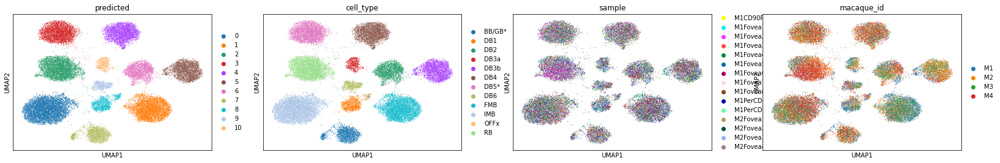

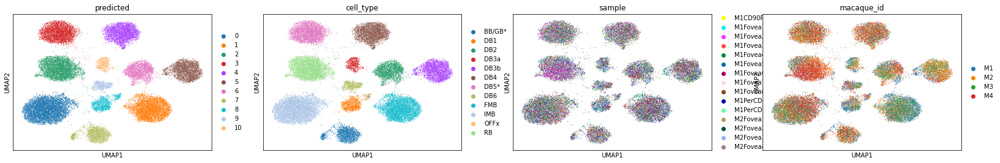

In [41]:
"""Get the predicted labels and compute adjusted rand score for the embedding"""

emb = deepcopy(latent)

formatting = AnnData(emb)
formatting.obs = anndataset.obs
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(anndataset.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("scVI Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["cell_type"] = list(anndataset.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["sample"] = list(anndataset.obs['sample'])
formatting.obs["region"] = list(anndataset.obs['region'])
formatting.obs["sample"] = list(batch_vec)

sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cell_type", "sample", "macaque_id"], return_fig=True)
print("Done")

visual

#### All Genes

Now, we evaluate an scVI model that was fit using all genes.

In [42]:
anndataset = read_macaque("../Data/macaque_bc.h5ad")
batch_vec = anndataset.obs['sample']
anndataset = anndataset.copy()
scvi.data.setup_anndata(anndataset, batch_key="sample")

vae = SCVI(anndataset, n_layers = 2)

filename = 'scVI Results All/macaque/bestmodelnew'

if not os.path.exists(filename):
    for i in range(200):
        vae.train(n_epochs = 200)
        vae.save(dir_path = 'scVI Results All/macaque/bestmodelnew')

vae = vae.load(anndataset, dir_path = 'scVI Results All/macaque/bestmodelnew')
latent = vae.get_latent_representation()

normalized_values = vae.get_normalized_expression(
    library_size=1e4,
    transform_batch = "M1Fovea1",
    n_samples=10,
    return_mean=True
)

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 30298 cells, 18083 genes, 30      
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


Now, we cluster cells using the denoised counts of all genes using scanpy. We visualize the denoised counts using UMAP, and compute the various clustering accuracy metrics.

... storing 'sample' as categorical


scVI Denoising Results for All Genes
ARI = 0.9667
NMI = 0.9503
Purity = 0.9797


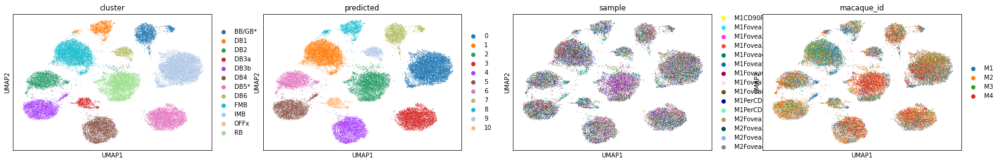

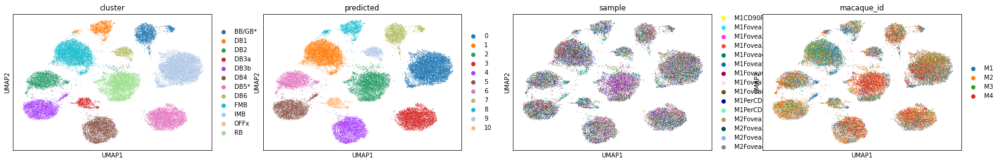

In [43]:
All_denoised = AnnData(deepcopy(normalized_values))
All_denoised.obs = anndataset.obs
All_denoised.write(filename="scVI Results All/macaque/denoised_scVI.h5ad")

sc.pp.log1p(All_denoised)
sc.pp.scale(All_denoised)
    
sc.tl.pca(All_denoised, svd_solver='arpack')
sc.pp.neighbors(All_denoised, n_neighbors = 15)
sc.tl.umap(All_denoised)
res = find_resolution(All_denoised, 11)
All_denoised = sc.tl.louvain(All_denoised, resolution = res, copy = True)

labels = All_denoised.obs['louvain']
All_denoised.obs['predicted'] = All_denoised.obs['louvain']
type_strings = list(All_denoised.obs['cluster'])

print("scVI Denoising Results for All Genes")

All_denoised.obs['sample'] = list(batch_vec)
visual = sc.pl.umap(All_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

visual

/Users/jlakkis/anaconda3/envs/cardec_alternatives/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:339: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... storing 'sample' as categorical


scVI Denoising Results for HVG Genes, from model trained with all genes
ARI = 0.9638
NMI = 0.9484
Purity = 0.9784


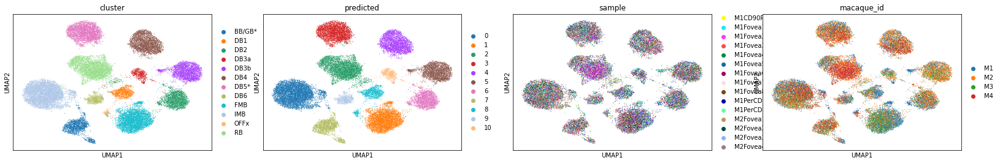

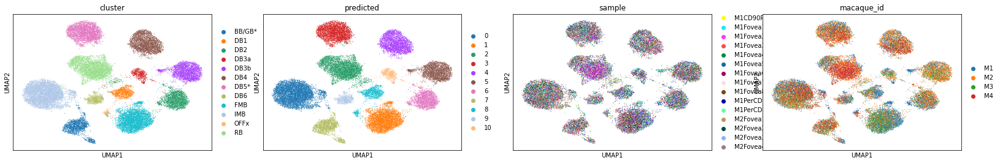

In [44]:
All_denoised = AnnData(deepcopy(normalized_values))
All_denoised.obs = anndataset.obs
All_denoised.obs['sample'] = list(batch_vec)
indices = [x in HVGs for x in list(anndataset.var.index)]
All_denoised = All_denoised[:, indices]

sc.pp.log1p(All_denoised)
sc.pp.scale(All_denoised)

sc.tl.pca(All_denoised, svd_solver='arpack')
sc.pp.neighbors(All_denoised, n_neighbors = 15)
sc.tl.umap(All_denoised)
res = find_resolution(All_denoised, 11)
All_denoised = sc.tl.louvain(All_denoised, resolution = res, copy = True)

labels = All_denoised.obs['louvain']
All_denoised.obs['predicted'] = All_denoised.obs['louvain']
type_strings = list(All_denoised.obs['cluster'])

print("scVI Denoising Results for HVG Genes, from model trained with all genes")

All_denoised.obs['sample'] = list(batch_vec)
visual = sc.pl.umap(All_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_data_gene.iloc[4,:3] = ARI, NMI, Purity
DF = pd.DataFrame(All_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = All_denoised.obs['macaque_id'].values
DF['Sample'] = All_denoised.obs['sample'].values
DF['Region'] = All_denoised.obs['region'].values
DF['Cell Type'] = All_denoised.obs['cluster'].values
DF.index = All_denoised.obs.index

base_path = 'scVI_HVG.csv'
path = os.path.join(figure_path, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

/Users/jlakkis/anaconda3/envs/cardec_alternatives/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:339: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... storing 'sample' as categorical


scVI Denoising Results for LVG Genes, from model trained with all genes
ARI = 0.9675
NMI = 0.9511
Purity = 0.9803


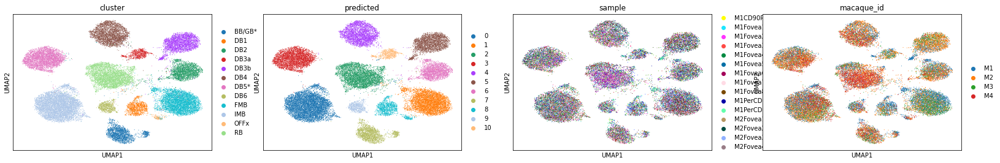

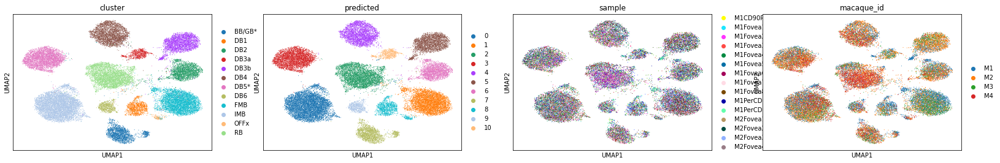

In [45]:
All_denoised = AnnData(deepcopy(normalized_values))
All_denoised.obs = anndataset.obs
All_denoised.obs['sample'] = list(batch_vec)
indices = [x not in HVGs for x in list(anndataset.var.index)]
All_denoised = All_denoised[:, indices]

sc.pp.log1p(All_denoised)
sc.pp.scale(All_denoised)

sc.tl.pca(All_denoised, svd_solver='arpack')
sc.pp.neighbors(All_denoised, n_neighbors = 15)
sc.tl.umap(All_denoised)
res = find_resolution(All_denoised, 11)
All_denoised = sc.tl.louvain(All_denoised, resolution = res, copy = True)

labels = All_denoised.obs['louvain']
All_denoised.obs['predicted'] = All_denoised.obs['louvain']
type_strings = list(All_denoised.obs['cluster'])

print("scVI Denoising Results for LVG Genes, from model trained with all genes")

All_denoised.obs['sample'] = list(batch_vec)
visual = sc.pl.umap(All_denoised, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_data_gene.iloc[5,:3] = ARI, NMI, Purity
DF = pd.DataFrame(All_denoised.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = All_denoised.obs['macaque_id'].values
DF['Sample'] = All_denoised.obs['sample'].values
DF['Region'] = All_denoised.obs['region'].values
DF['Cell Type'] = All_denoised.obs['cluster'].values
DF.index = All_denoised.obs.index

base_path = 'scVI_LVG.csv'
path = os.path.join(figure_path, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

Then, we cluster cells using the low-dimensional latent space learned by scVI using scanpy. We visualize the latent space using UMAP, and compute the various clustering accuracy metrics.

scVI Clustering Results
ARI = 0.9503
NMI = 0.9339
Purity = 0.9720


... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'cell_type' as categorical
... storing 'predicted' as categorical


Done


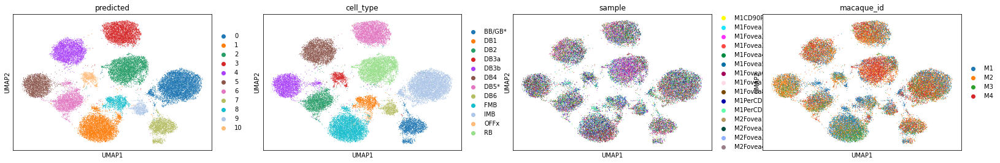

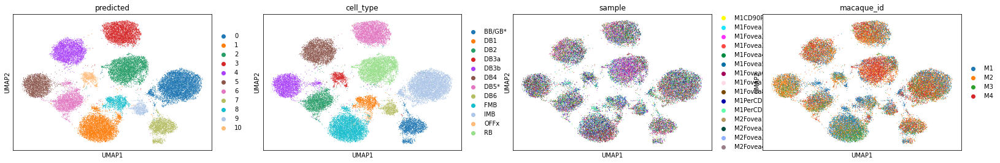

In [46]:
"""Get the predicted labels and compute adjusted rand score for the scVI embedding"""

emb = deepcopy(latent)

formatting = AnnData(emb)
formatting.obs = anndataset.obs
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')
res = find_resolution(formatting, 11)
formatting = sc.tl.louvain(formatting, resolution = res, copy = True)

labels = formatting.obs['louvain']
type_strings = list(anndataset.obs['cluster'])

ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print("scVI Clustering Results")
print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

formatting.obs["cell_type"] = list(anndataset.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["sample"] = list(anndataset.obs['sample'])
formatting.obs["region"] = list(anndataset.obs['region'])
formatting.obs["sample"] = list(batch_vec)

sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cell_type", "sample", "macaque_id"], return_fig=True)
print("Done")

"""Figure info for paper"""
DF = pd.DataFrame(formatting.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Region'] = formatting.obs['region'].values
DF['Macaque'] = formatting.obs['macaque_id'].values
DF['Sample'] = formatting.obs['sample'].values
DF['Cell Type'] = formatting.obs['cluster'].values
DF.index = formatting.obs.index

base_path = 'scVI.csv'
path = os.path.join(figure_path_embedding, base_path)

DF.to_csv(path)

ARI_data.iloc[2,:3] = ARI, NMI, Purity

visual

## scDeepCluster Model

Next, we fit the scDeepCluster model. scDeepCluster is a deep learning method for clustering scRNA-seq data. Like CarDEC, scDeepCluster leverages the iDEC framework. Unlike CarDEC, scDeepCluster lacks the utility of batch indicators in its pretraining step, uses louvain clustering rather than kmeans, and has no framework at all for denoising low variance genes (and it does not even have a method for denoising high variance genes). Please note that scDeepCluster is a framework only for clustering scRNA-seq data, not for denoising it. For more information, please consult the references:

Manuscript: https://www.nature.com/articles/s42256-019-0037-0

Software: https://github.com/ttgump/scDeepCluster

First, we start off by setting optimizers and preparing the data for analysis with scDeepCluster. Since this model is built only to cluster the data, we retain only the top 2000 highly variable genes.

In [47]:
optimizer1 = Adam(amsgrad=True)
optimizer2 = 'adadelta'

adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
adata2 = adata.copy()
sc.pp.filter_genes(adata2, min_counts=1)
sc.pp.filter_cells(adata2, min_counts=1)

sc.pp.normalize_total(adata2)
size_factors = adata2.obs['n_counts'] / np.median(adata2.obs['n_counts'])

sc.pp.log1p(adata2)

indices = [x in HVGs for x in list(adata.var.index)]
adata = adata[:, indices]

# preprocessing scRNA-seq read counts matrix
print(adata.X.shape)

x = adata.X.toarray()
y = np.asarray(convert_vector_to_encoding(adata.obs['cluster']))
adata.obs['group'] = y

adata = sc.AnnData(x)

adata = read_dataset(adata,
                 transpose=False,
                 test_split=False,
                 copy=True)

adata = normalize(adata,
                  size_factors=True,
                  normalize_input=True,
                  logtrans_input=True)

input_size = adata.n_vars

print('Sample size')
print(adata.X.shape)

x_sd = adata.X.std(0)
x_sd_median = np.median(x_sd)

update_interval = int(adata.X.shape[0]/256)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
(30298, 2000)


Trying to set attribute `.obs` of view, copying.


### Autoencoder: Successfully preprocessed 2000 genes and 30298 cells.
Sample size
(30298, 2000)


We define the scDeepCluster model and load the weights. If the scDeepCluster weights do not exist, then we fit the model and save the weights. Note that, unwisely, the scDeepCluster algorithm does not have any test or validation metric, so we cannot do early stopping for this method.

In [48]:
# Define scDeepCluster model
scDeepCluster = SCDeepCluster(dims=[input_size, 256, 64, 32], n_clusters=11, noise_sd=2.5)
print("autoencoder summary")
scDeepCluster.autoencoder.summary()
print("model summary")
scDeepCluster.model.summary()

t0 = time()

save_dir = 'scDeepCluster Macaque'
weight_dir = os.path.join(save_dir, 'scDeepCluster_model_final.h5')

if not os.path.isfile(weight_dir):
    # Pretrain autoencoders before clustering
    scDeepCluster.pretrain(x=[adata.X, adata.obs.size_factors], y=adata.raw.X, batch_size=256, epochs=100, optimizer=optimizer1, ae_file='ae_weights.h5')

    # begin clustering, time not include pretraining part.

    gamma = 1. # set hyperparameter gamma
    scDeepCluster.fit(x_counts=adata.X, sf=adata.obs.size_factors, y=y, raw_counts=adata.raw.X, batch_size=256, tol=0.001, maxiter=20000,
             update_interval=update_interval, ae_weights=None, save_dir = save_dir, loss_weights=[gamma, 1], optimizer=optimizer2)

scDeepCluster.load_weights(weight_dir)

autoencoder summary
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
counts (InputLayer)             (None, 2000)         0                                            
__________________________________________________________________________________________________
input_noise (GaussianNoise)     (None, 2000)         0           counts[0][0]                     
__________________________________________________________________________________________________
encoder_0 (Dense)               (None, 256)          512256      input_noise[0][0]                
__________________________________________________________________________________________________
noise_0 (GaussianNoise)         (None, 256)          0           encoder_0[0][0]                  
________________________________________________________________________

Lastly, we predict cluster assignment using scDeepCluster. We plot the embedded latent space of this model using scanpy louvain clustering, and we evaluate clustering accuracy as usual via ARI, NMI, and purity.

/Users/jlakkis/anaconda3/envs/cardec_alternatives/lib/python3.7/site-packages/sklearn/utils/linear_assignment_.py:22: FutureWarning: The linear_assignment_ module is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)
/Users/jlakkis/anaconda3/envs/cardec_alternatives/lib/python3.7/site-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)
... storing 'predicted' as categorical
... storing 'cell_type' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical
... storing 'macaque_id' as categorical


scDeepCluster Final: ACC= 0.7735, NMI= 0.8257, ARI= 0.7322, Purity = 0.8356
Clustering time: 17 seconds.


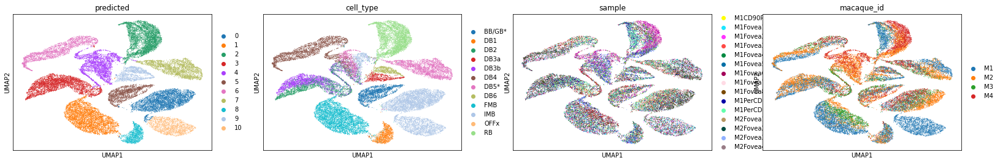

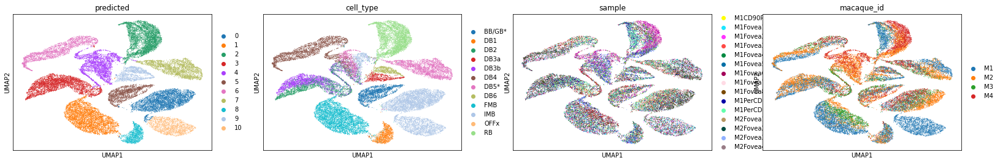

In [49]:
# Show the final results
y_pred = np.asarray(scDeepCluster.predict_clusters([adata.X, adata.obs.size_factors]))
acc = np.round(cluster_acc(y, y_pred), 5)
nmi = np.round(metrics.normalized_mutual_info_score(y, y_pred), 5)
ari = np.round(metrics.adjusted_rand_score(y, y_pred), 5)
purity = np.round(purity_score(y, y_pred), 5)

hidden_layer = scDeepCluster.model.get_layer(name='encoder_hidden').get_output_at(1)
hidden_output_model = Model(inputs = scDeepCluster.model.input, outputs = hidden_layer)
latent_space = hidden_output_model.predict([adata.X, adata.obs.size_factors])
latent_space = np.asarray(latent_space)

formatting = AnnData(latent_space)
sc.pp.neighbors(formatting, n_neighbors = 15, use_rep = 'X')

formatting.obs['predicted'] = y_pred
labels = formatting.obs['predicted']
type_strings = list(anndataset.obs['cluster'])

formatting.obs["cell_type"] = list(anndataset.obs['cluster'])
formatting.obs["predicted"] = list(labels)
formatting.obs["predicted"] = [str(x) for x in formatting.obs["predicted"]]
formatting.obs["sample"] = list(anndataset.obs['sample'])
formatting.obs["region"] = list(anndataset.obs['region'])
formatting.obs["macaque_id"] = list(anndataset.obs['macaque_id'])
formatting.obs['sample'] = [str(x) for x in formatting.obs['sample']]

sc.tl.umap(formatting)
visual = sc.pl.umap(formatting, color = ["predicted", "cell_type", "sample", "macaque_id"], return_fig=True)

print('scDeepCluster Final: ACC= %.4f, NMI= %.4f, ARI= %.4f, Purity = %.4f' % (acc, nmi, ari, purity))
print('Clustering time: %d seconds.' % int(time() - t0))

"""Figure info for paper"""
DF = pd.DataFrame(formatting.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Region'] = formatting.obs['region'].values
DF['Macaque'] = formatting.obs['macaque_id'].values
DF['Sample'] = formatting.obs['sample'].values
DF['Cell Type'] = formatting.obs['cell_type'].values
DF.index = formatting.obs.index

base_path = 'scDeepCluster.csv'
path = os.path.join(figure_path_embedding, base_path)

DF.to_csv(path)

ARI_data.iloc[3,:3] = ari, nmi, purity
ARI_data.to_csv(os.path.join(figure_path_embedding, 'ARIsummary_competitors.csv'))

visual

## MNN

Lastly, we run Mutual Nearest Neighbors (MNN). The premise of MNN is to find pairs of mutual nearest neighbor cells between batches. The theory behind MNN is that any differences between cells in these MNN pairs are good estimates of batch effects. Averaging these differences over many MNN pairs then provides a better estimate of batch effect, and a correction vector can be applied to correct the count matrix. With the corrected counts, we can then perform downstream analysis like clustering. For more information, please consult the references:

Manuscript: https://www.nature.com/articles/nbt.4091

Software: https://bioconductor.org/packages/release/bioc/html/batchelor.html

A few comments.
    1. MNN can be run in python using the mnnpy package. However, the installation of mnnpy fails to build on a MacOS system. As I work only on MacOS, I had to improvise and run mnnCorrect in R, save the corrected counts to the disk as "corrected_data.csv," and then load the matrix into this notebook to run downstream louvain clustering on it with scanpy. For this reason, MNN itself is not implemented in this notebook. Please see the Rscript for the implementation. Rscript for MNN with HVGs only is "MNN_sampleMacaque_HVG.R", and MNN with all genes is implemented in "MNN_sampleMacaque.R"
    2. Following the author's reccomendation, the count matrix is corrected for sequencing depth via size factors, and is then logtransformed before being fed into MNN. All of this is done in the R script. For a citation of the author's suggested normlization method, please see the link below.
    3. Following the author's reccomendation, the outputted corrected matrix from MNN is fed directly in scanpy's louvain clustering. No normalization of any kind is performed, as the author suggests that no normalization is needed after MNN correction. For citation of this, see the same link cited in comment 2.

Author's Comments: https://support.bioconductor.org/p/106010/

First, we load the corrected matrix into python, along with metadata. Then, these loaded representations are converted to an Annotated DataFrame. Note, the corrected matrix is big and dense, so this will likely take a few minutes.

#### HVGs

In [50]:
MNNdata = pd.read_csv("MNNcorrected_hvg/corrected_dataSample.csv", index_col = 0)
meta_data = pd.read_csv("MNNcorrected_hvg/corrected_metadataSample.csv", index_col = 0)
MNNdata = MNNdata.T

In [51]:
MNNdata_frame = AnnData(MNNdata)
MNNdata_frame.obs = meta_data
adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
MNNdata_frame.obs['cluster'] = adata.obs['cluster']

del MNNdata, meta_data, adata

MNNdata_frame

AnnData object with n_obs × n_vars = 30298 × 2000
    obs: 'batch', 'sample', 'macaque_id', 'nGene', 'nTranscripts', 'cluster', 'region', 'class', 'n_genes', 'n_counts'

First, we cluster cells using the batch corrected counts of highly variable genes using scanpy. We visualize the corrected counts using UMAP, and compute the various clustering accuracy metrics.

... storing 'sample' as categorical
... storing 'macaque_id' as categorical
... storing 'region' as categorical
... storing 'class' as categorical


MNN Batch Corrected Clustering Results for HVG
ARI = 0.9366
NMI = 0.9211
Purity = 0.9664


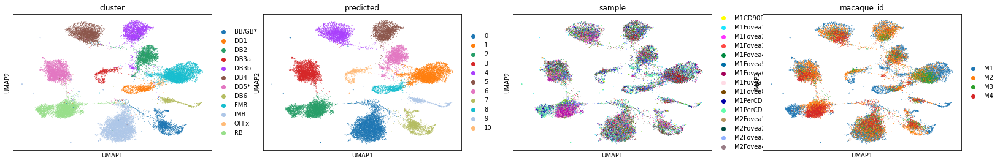

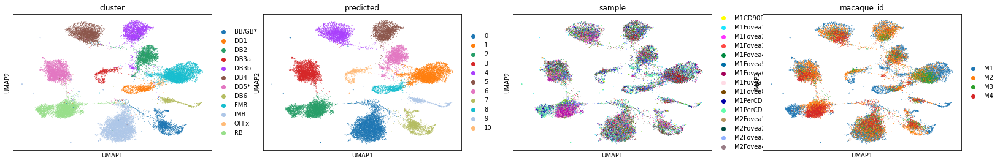

In [52]:
MNN_HVG = MNNdata_frame.copy()

sc.tl.pca(MNN_HVG, svd_solver='arpack')
sc.pp.neighbors(MNN_HVG, n_neighbors = 15)
sc.tl.umap(MNN_HVG)
res = find_resolution(MNN_HVG, 11)
MNN_HVG = sc.tl.louvain(MNN_HVG, resolution = res, copy = True)

labels = MNN_HVG.obs['louvain']
MNN_HVG.obs['predicted'] = MNN_HVG.obs['louvain']
type_strings = list(MNN_HVG.obs['cluster'])

print("MNN Batch Corrected Clustering Results for HVG")

visual = sc.pl.umap(MNN_HVG, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_HVGo_gene.iloc[3,:3] = ARI, NMI, Purity
DF = pd.DataFrame(MNN_HVG.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = MNN_HVG.obs['macaque_id'].values
DF['Sample'] = MNN_HVG.obs['sample'].values
DF['Region'] = MNN_HVG.obs['region'].values
DF['Cell Type'] = MNN_HVG.obs['cluster'].values
DF.index = MNN_HVG.obs.index

base_path = 'MNN_HVGOnly.csv'
path = os.path.join(figure_path_supplement, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

#### All Genes

In [53]:
MNNdata = pd.read_csv("MNNcorrected/corrected_dataSample.csv", index_col = 0)
meta_data = pd.read_csv("MNNcorrected/corrected_metadataSample.csv", index_col = 0)
MNNdata = MNNdata.T

In [54]:
MNNdata_frame = AnnData(MNNdata)
MNNdata_frame.obs = meta_data
adata = read_macaque("../Data/macaque_bc.h5ad", cache=True)
MNNdata_frame.obs['cluster'] = adata.obs['cluster']

del MNNdata, meta_data, adata

MNNdata_frame

AnnData object with n_obs × n_vars = 30298 × 18083
    obs: 'macaque_id', 'sample', 'region', 'cluster'

First, we cluster cells using the batch corrected counts of highly variable genes using scanpy. We visualize the corrected counts using UMAP, and compute the various clustering accuracy metrics.

... storing 'macaque_id' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical


MNN Batch Corrected Clustering Results for HVG
ARI = 0.9069
NMI = 0.8809
Purity = 0.9430


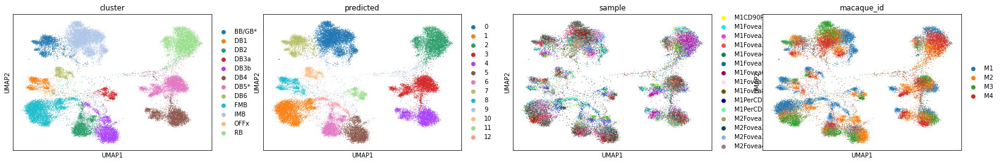

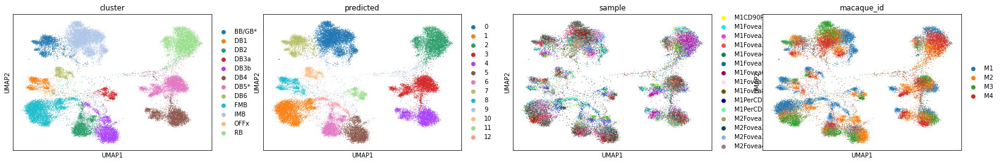

In [55]:
MNN_HVG = MNNdata_frame.copy()
indices = [x in HVGs for x in list(MNN_HVG.var.index)]
MNN_HVG = MNN_HVG[:, indices]

sc.tl.pca(MNN_HVG, svd_solver='arpack')
sc.pp.neighbors(MNN_HVG, n_neighbors = 15)
sc.tl.umap(MNN_HVG)
res = find_resolution(MNN_HVG, 13)
MNN_HVG = sc.tl.louvain(MNN_HVG, resolution = res, copy = True)

labels = MNN_HVG.obs['louvain']
MNN_HVG.obs['predicted'] = MNN_HVG.obs['louvain']
type_strings = list(MNN_HVG.obs['cluster'])

print("MNN Batch Corrected Clustering Results for HVG")

visual = sc.pl.umap(MNN_HVG, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_data_gene.iloc[6,:3] = ARI, NMI, Purity
DF = pd.DataFrame(MNN_HVG.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = MNN_HVG.obs['macaque_id'].values
DF['Sample'] = MNN_HVG.obs['sample'].values
DF['Region'] = MNN_HVG.obs['region'].values
DF['Cell Type'] = MNN_HVG.obs['cluster'].values
DF.index = MNN_HVG.obs.index

base_path = 'MNN_HVG.csv'
path = os.path.join(figure_path, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

visual

Then, we cluster cells using the batch corrected counts of lowly variable genes using scanpy. We visualize the corrected counts using UMAP, and compute the various clustering accuracy metrics.

... storing 'macaque_id' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical


MNN Batch Corrected Clustering Results for LVG
ARI = 0.0283
NMI = 0.0559
Purity = 0.2667


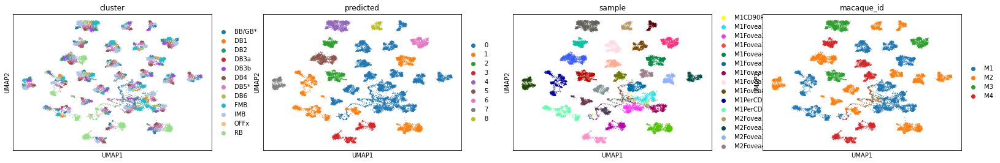

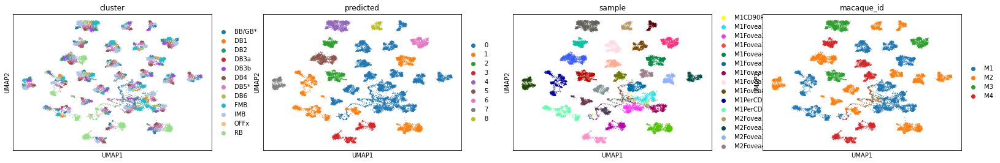

In [56]:
MNN_LVG = MNNdata_frame.copy()
indices = [x not in HVGs for x in list(MNN_LVG.var.index)]
MNN_LVG = MNN_LVG[:, indices]

sc.tl.pca(MNN_LVG, svd_solver='arpack')
sc.pp.neighbors(MNN_LVG, n_neighbors = 15)
sc.tl.umap(MNN_LVG)
res = find_resolution(MNN_LVG, 11)
MNN_LVG = sc.tl.louvain(MNN_LVG, resolution = res, copy = True)

labels = MNN_LVG.obs['louvain']
MNN_LVG.obs['predicted'] = MNN_LVG.obs['louvain']
type_strings = list(MNN_LVG.obs['cluster'])

print("MNN Batch Corrected Clustering Results for LVG")

visual = sc.pl.umap(MNN_LVG, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

"""Figure info for main paper"""
ARI_data_gene.iloc[7,:3] = ARI, NMI, Purity
DF = pd.DataFrame(MNN_LVG.obsm['X_umap'])
DF.columns = ['UMAP1', 'UMAP2']
DF['Macaque'] = MNN_LVG.obs['macaque_id'].values
DF['Sample'] = MNN_LVG.obs['sample'].values
DF['Region'] = MNN_LVG.obs['region'].values
DF['Cell Type'] = MNN_LVG.obs['cluster'].values
DF.index = MNN_LVG.obs.index

base_path = 'MNN_LVG.csv'
path = os.path.join(figure_path, base_path)
path_supplement = os.path.join(figure_path_supplement, base_path)

DF.to_csv(path)
DF.to_csv(path_supplement)

ARI_HVGo_gene.to_csv(os.path.join(figure_path_supplement, 'genespaceARIs_competitors_HVGo.csv'))
ARI_data_gene.to_csv(os.path.join(figure_path, 'genespaceARIs_competitors.csv'))

visual

Now, we cluster cells using the batch corrected counts of all genes using scanpy. We visualize the corrected counts using UMAP, and compute the various clustering accuracy metrics.

... storing 'macaque_id' as categorical
... storing 'sample' as categorical
... storing 'region' as categorical


MNN Batch Corrected Clustering Results for All Genes
ARI = 0.0044
NMI = 0.0688
Purity = 0.2567


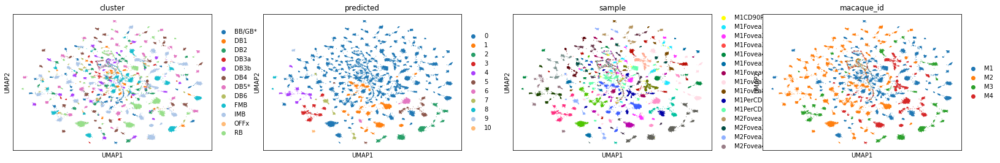

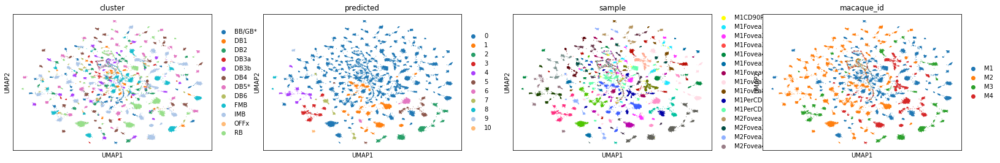

In [57]:
sc.tl.pca(MNNdata_frame, svd_solver='arpack')
sc.pp.neighbors(MNNdata_frame, n_neighbors = 15)
sc.tl.umap(MNNdata_frame)
res = find_resolution(MNNdata_frame, 11)
MNNdata_frame = sc.tl.louvain(MNNdata_frame, resolution = res, copy = True)

labels = MNNdata_frame.obs['louvain']
MNNdata_frame.obs['predicted'] = MNNdata_frame.obs['louvain']
type_strings = list(MNNdata_frame.obs['cluster'])

print("MNN Batch Corrected Clustering Results for All Genes")

visual = sc.pl.umap(MNNdata_frame, color = ["cluster", "predicted", "sample", "macaque_id"], return_fig=True)
ARI, NMI, Purity = adjusted_rand_score(labels,type_strings), normalized_mutual_info_score(type_strings,labels), purity_score(type_strings,labels)

print ("ARI = {0:.4f}".format(ARI)) 
print ("NMI = {0:.4f}".format(NMI)) 
print ("Purity = {0:.4f}".format(Purity))

visual